# Week 5: Supervised Land Cover Classification with Sentinel-2

In this lab, we compare several ML models for classifying Sentinel-2 data over Vienna, Austria to produce a forest cover map.

Based on [Project Pythia's classification cookbook](https://projectpythia.org/eo-datascience-cookbook/notebooks/templates/classification/).

In [ ]:
# Imports
from datetime import datetime, timedelta

import geopandas as gpd
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import numpy as np
import odc.stac
import pystac_client
import rioxarray  # noqa: F401
import xarray as xr
from dask.distributed import Client
from matplotlib.patches import Patch
from odc.geo.geobox import GeoBox
from shapely.geometry import Polygon
from skimage.filters import threshold_otsu
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    ConfusionMatrixDisplay,
    accuracy_score,
    classification_report,
)
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler

client = Client(processes=False)

/home/nissim/Documents/dev/musa-650-spring-2026/.venv/lib/python3.11/site-packages/rasterio/warp.py:387: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dest = _reproject(


---
## Part 1: Data Acquisition + Preprocessing

We'll pull Sentinel-2 L2A data over Vienna from May 2024, compute a cloud-free median composite, and visualize both RGB and false-color composites.

In [2]:
# Define spatial and temporal extent
dx = 0.0006  # ~60m resolution
epsg = 4326

# Vienna area bounds
latmin, latmax = 47.86, 48.407
lonmin, lonmax = 16.32, 16.9
bounds = (lonmin, latmin, lonmax, latmax)

# Temporal extent: May 2024
start_date = datetime(year=2024, month=5, day=1)
end_date = start_date + timedelta(days=10)

time_format = "%Y-%m-%d"
date_query = f"{start_date.strftime(time_format)}/{end_date.strftime(time_format)}"

# Search for Sentinel-2 data
items = (
    pystac_client.Client.open("https://earth-search.aws.element84.com/v1")
    .search(
        bbox=bounds,
        collections=["sentinel-2-l2a"],
        datetime=date_query,
        limit=100,
    )
    .item_collection()
)
print(f"{len(items)} scenes found")

# Create geobox and load data
geobox = GeoBox.from_bbox(bounds, crs=f"epsg:{epsg}", resolution=dx)

dc = odc.stac.load(
    items,
    bands=["scl", "red", "green", "blue", "nir"],
    chunks={"time": 5, "x": 600, "y": 600},
    geobox=geobox,
    resampling="bilinear",
)
dc

10 scenes found


<xarray.Dataset> Size: 79MB
Dimensions:      (latitude: 913, longitude: 967, time: 10)
Coordinates:
  * latitude     (latitude) float64 7kB 48.41 48.41 48.41 ... 47.86 47.86 47.86
  * longitude    (longitude) float64 8kB 16.32 16.32 16.32 ... 16.9 16.9 16.9
  * time         (time) datetime64[ns] 80B 2024-05-01T09:57:21.858000 ... 202...
    spatial_ref  int32 4B 4326
Data variables:
    scl          (time, latitude, longitude) uint8 9MB dask.array<chunksize=(5, 600, 600), meta=np.ndarray>
    red          (time, latitude, longitude) uint16 18MB dask.array<chunksize=(5, 600, 600), meta=np.ndarray>
    green        (time, latitude, longitude) uint16 18MB dask.array<chunksize=(5, 600, 600), meta=np.ndarray>
    blue         (time, latitude, longitude) uint16 18MB dask.array<chunksize=(5, 600, 600), meta=np.ndarray>
    nir          (time, latitude, longitude) uint16 18MB dask.array<chunksize=(5, 600, 600), meta=np.ndarray>

In [3]:
# Cloud masking function


def is_valid_pixel(data):
    """Include only vegetated, not_vegetated, water, and snow pixels (SCL classes 4-6 and 11)"""
    return ((data > 3) & (data < 7)) | (data == 11)


valid_mask = is_valid_pixel(dc.scl)
dc_valid = dc.where(valid_mask)

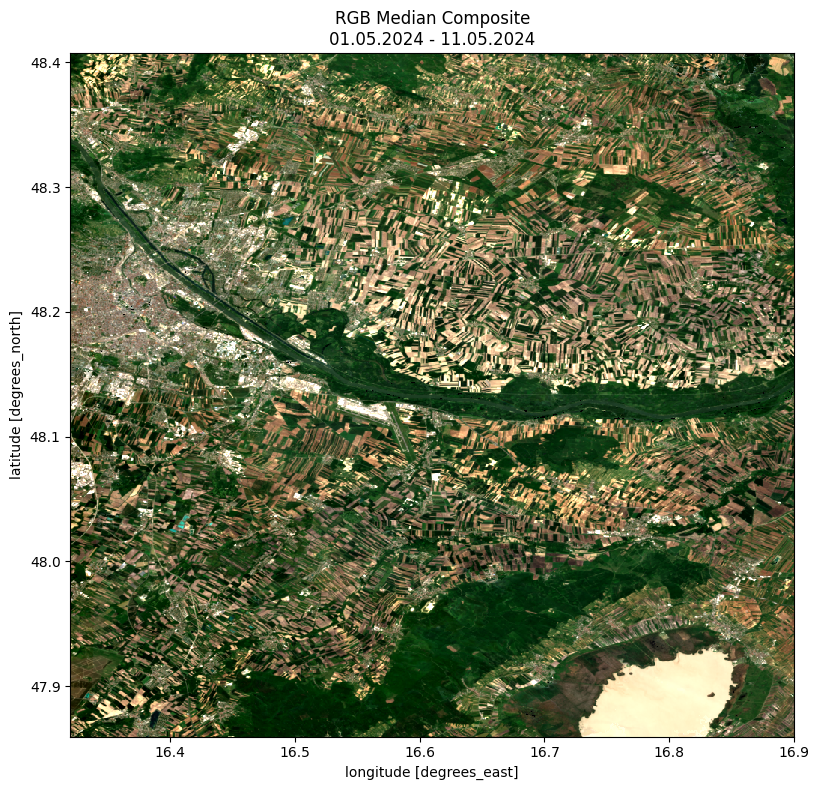

In [4]:
# Compute median composite for RGB
rgb_median = (
    dc_valid[["red", "green", "blue"]]
    .to_dataarray(dim="band")
    .median(dim="time")
    .astype(int)
)

# Plot RGB composite
title_rgb = f"RGB Median Composite\n{start_date.strftime('%d.%m.%Y')} - {end_date.strftime('%d.%m.%Y')}"
fig1, ax1 = plt.subplots(figsize=(10, 8))
rgb_median.plot.imshow(ax=ax1, robust=True)
ax1.set_title(title_rgb)
ax1.set_aspect("equal")
plt.tight_layout()

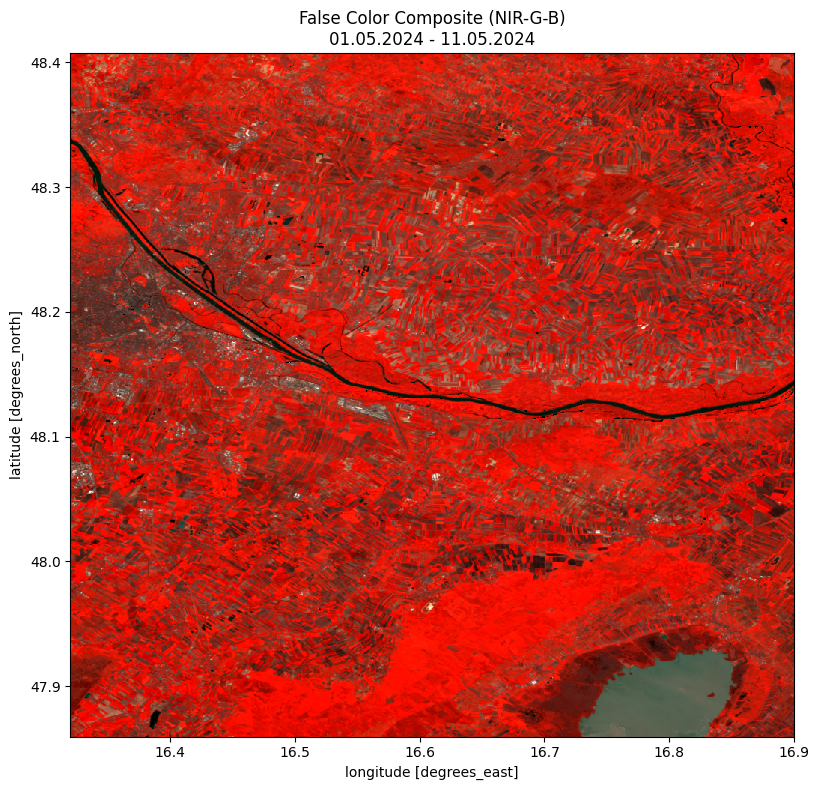

In [5]:
# Compute false color composite (NIR-Green-Blue)
fc_median = (
    dc_valid[["nir", "green", "blue"]]
    .to_dataarray(dim="band")
    .transpose(..., "band")
    .median(dim="time")
    .astype(int)
)

title_fc = f"False Color Composite (NIR-G-B)\n{start_date.strftime('%d.%m.%Y')} - {end_date.strftime('%d.%m.%Y')}"
fig2, ax2 = plt.subplots(figsize=(10, 8))
fc_median.plot.imshow(ax=ax2, robust=True)
ax2.set_title(title_fc)
ax2.set_aspect("equal")
plt.tight_layout()

---
## Part 2: Baseline — NDVI + Otsu's Method

We calculate NDVI and apply Otsu's automatic thresholding method to produce a binary vegetation mask.

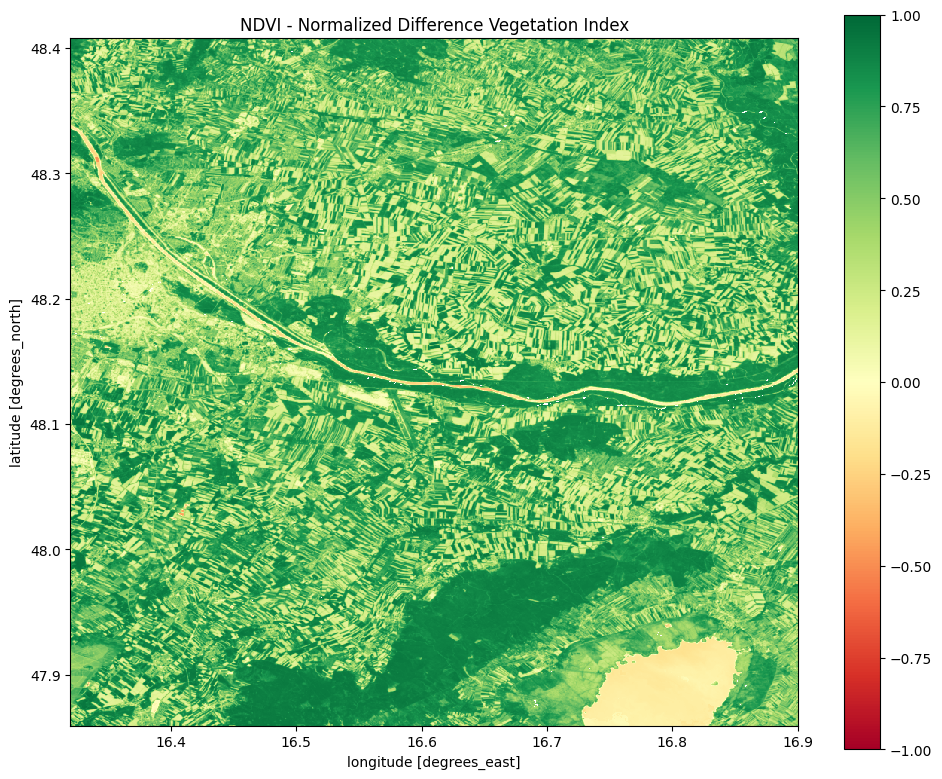

In [6]:
# Calculate NDVI


def normalized_difference(a, b):
    """Compute normalized difference: (a - b) / (a + b)"""
    return (a.astype(float) - b.astype(float)) / (a + b)


ndvi = normalized_difference(dc_valid.nir, dc_valid.red)
ndvi_median = ndvi.median(dim="time")

# Plot NDVI
fig3, ax3 = plt.subplots(figsize=(10, 8))
ndvi_median.plot.imshow(ax=ax3, cmap="RdYlGn", vmin=-1, vmax=1)
ax3.set_title("NDVI - Normalized Difference Vegetation Index")
ax3.set_aspect("equal")
plt.tight_layout()

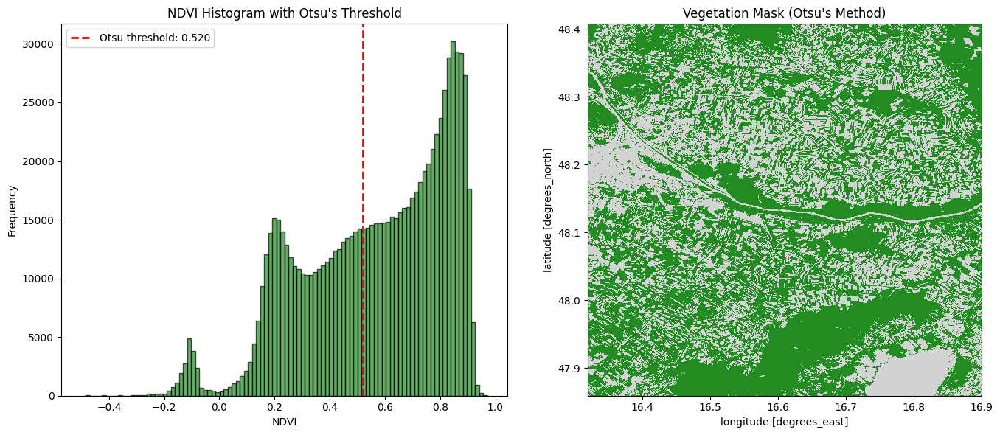

In [7]:
# Apply Otsu's method
ndvi_values = ndvi_median.values.flatten()
ndvi_valid = ndvi_values[~np.isnan(ndvi_values)]

otsu_threshold = threshold_otsu(ndvi_valid)

# Create binary mask
vegetation_mask_otsu = ndvi_median > otsu_threshold

# Plot the result
fig4, axes4 = plt.subplots(1, 2, figsize=(14, 6))

# Histogram with threshold
axes4[0].hist(ndvi_valid, bins=100, color="forestgreen", alpha=0.7, edgecolor="black")
axes4[0].axvline(
    otsu_threshold,
    color="red",
    linestyle="--",
    linewidth=2,
    label=f"Otsu threshold: {otsu_threshold:.3f}",
)
axes4[0].set_xlabel("NDVI")
axes4[0].set_ylabel("Frequency")
axes4[0].set_title("NDVI Histogram with Otsu's Threshold")
axes4[0].legend()

# Binary mask
cmap_binary = mcolors.ListedColormap(["lightgray", "forestgreen"])
vegetation_mask_otsu.plot.imshow(ax=axes4[1], cmap=cmap_binary, add_colorbar=False)
axes4[1].set_title("Vegetation Mask (Otsu's Method)")
axes4[1].set_aspect("equal")

plt.tight_layout()

Notice that Vienna's landscape is far from homogenous: the area contains forests, agriculture, urban areas (including urban parks), etc. NDVI will pick up on _any_ vegetation---but we only want forests (not, say, vineyards). So while Otsu's method applied to NDVI can give us a good threshold to distinguish vegetation from non-vegetation, it won't help us distinguish forests from other kinds of vegetated areas.

---
## Part 3: Classification

Now we'll use supervised classification with training polygons to distinguish forest from non-forest.

In [8]:
# Define training polygons (from Project Pythia cookbook)
forest_areas = {
    0: [
        Polygon(
            [
                (16.482772, 47.901753),
                (16.465133, 47.870124),
                (16.510142, 47.874382),
                (16.482772, 47.901753),
            ]
        )
    ],
    1: [
        Polygon(
            [
                (16.594079, 47.938855),
                (16.581914, 47.894454),
                (16.620233, 47.910268),
                (16.594079, 47.938855),
            ]
        )
    ],
    2: [
        Polygon(
            [
                (16.67984, 47.978998),
                (16.637263, 47.971091),
                (16.660376, 47.929123),
                (16.67984, 47.978998),
            ]
        )
    ],
    3: [
        Polygon(
            [
                (16.756477, 48.000286),
                (16.723024, 47.983256),
                (16.739446, 47.972916),
                (16.756477, 48.000286),
            ]
        )
    ],
    4: [
        Polygon(
            [
                (16.80696, 48.135923),
                (16.780806, 48.125583),
                (16.798445, 48.115243),
                (16.80696, 48.135923),
            ]
        )
    ],
    5: [
        Polygon(
            [
                (16.684097, 48.144438),
                (16.664634, 48.124366),
                (16.690788, 48.118892),
                (16.684097, 48.144438),
            ]
        )
    ],
    6: [
        Polygon(
            [
                (16.550894, 48.169984),
                (16.530822, 48.165118),
                (16.558801, 48.137139),
                (16.550894, 48.169984),
            ]
        )
    ],
    7: [
        Polygon(
            [
                (16.588604, 48.402329),
                (16.556976, 48.401112),
                (16.580697, 48.382865),
                (16.588604, 48.402329),
            ]
        )
    ],
}

nonforest_areas = {
    0: [
        Polygon(
            [
                (16.674974, 48.269126),
                (16.623882, 48.236281),
                (16.682272, 48.213168),
                (16.674974, 48.269126),
            ]
        )
    ],
    1: [
        Polygon(
            [
                (16.375723, 48.228374),
                (16.357476, 48.188839),
                (16.399444, 48.185798),
                (16.375723, 48.228374),
            ]
        )
    ],
    2: [
        Polygon(
            [
                (16.457834, 48.26426),
                (16.418907, 48.267301),
                (16.440804, 48.23324),
                (16.457834, 48.26426),
            ]
        )
    ],
    3: [
        Polygon(
            [
                (16.519266, 48.101861),
                (16.470607, 48.100645),
                (16.500411, 48.07145),
                (16.519266, 48.101861),
            ]
        )
    ],
    4: [
        Polygon(
            [
                (16.453577, 48.051986),
                (16.412217, 48.067192),
                (16.425598, 48.012451),
                (16.453577, 48.051986),
            ]
        )
    ],
}

# Convert to GeoDataFrames
forest_gdf = gpd.GeoDataFrame(
    {"geometry": [poly[0] for poly in forest_areas.values()], "class": "forest"},
    crs="EPSG:4326",
)
nonforest_gdf = gpd.GeoDataFrame(
    {"geometry": [poly[0] for poly in nonforest_areas.values()], "class": "non-forest"},
    crs="EPSG:4326",
)

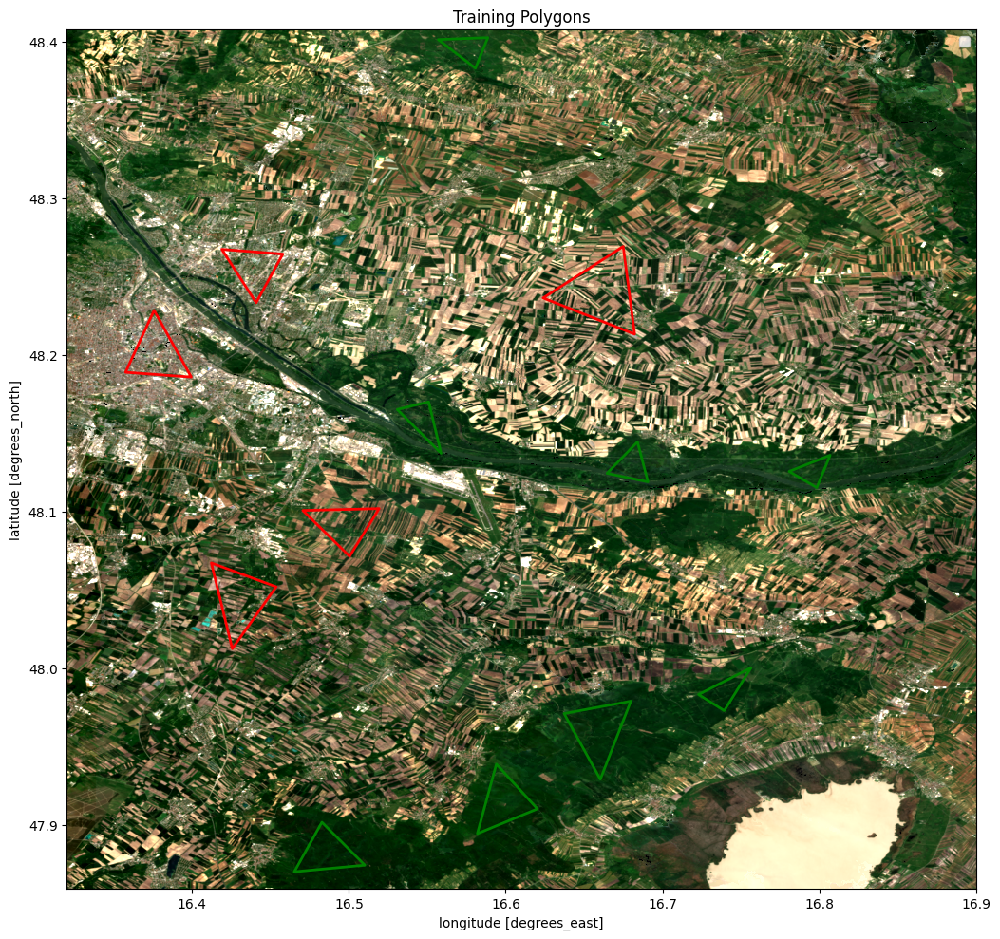

In [9]:
# Plot training polygons on the RGB image
fig5, ax5 = plt.subplots(figsize=(12, 10))
rgb_median.plot.imshow(ax=ax5, robust=True)
forest_gdf.plot(
    ax=ax5, facecolor="none", edgecolor="green", linewidth=2, label="Forest"
)
nonforest_gdf.plot(
    ax=ax5, facecolor="none", edgecolor="red", linewidth=2, label="Non-forest"
)
ax5.set_title("Training Polygons")
ax5.set_aspect("equal")
ax5.legend(["Forest", "Non-forest"], loc="upper right")
plt.tight_layout()

Notice here that both forest and non-forest polygons are big enough to contain a mix. Looking closely, we can definitely see some green spaces in the "non-forest" urban areas, plus we can see that some of the "forest" polygons include parts of the Danube river. This means that are labels don't really correspond as neatly as they should to a pure separation of forest versus non-forest pixels, which will impact our model performance.

Remember that NIR, red, and green are especially useful for detecting the presence of vegetation (we covered this in previous classes and labs). Unlike last week, we're not just randomly throwing all the bands into our model---we're being deliberate about feature selection.

In [10]:
# Prepare classification dataset
bands = ["red", "green", "blue", "nir"]
ds_class = (
    dc_valid[bands].median(dim="time").compute()
)  # Materialize once to avoid re-reading from cloud
ds_class = ds_class.fillna(0)


def clip_array(ds: xr.Dataset, polygons):
    """Clip dataset to polygons"""
    clipped = ds.rio.clip(polygons, invert=False, all_touched=False, drop=True)
    clipped_nan = clipped.where(clipped == ds)
    return clipped_nan


# Extract pixel values from training polygons
feat_data = [
    clip_array(ds_class, polygon).to_array().values.reshape(len(bands), -1).T
    for polygon in forest_areas.values()
]
nonfeat_data = [
    clip_array(ds_class, polygon).to_array().values.reshape(len(bands), -1).T
    for polygon in nonforest_areas.values()
]

# Concatenate and clean
feat_values = np.concatenate(feat_data)
nonfeat_values = np.concatenate(nonfeat_data)
X_feat = feat_values[~np.isnan(feat_values).any(axis=1)]
X_nonfeat = nonfeat_values[~np.isnan(nonfeat_values).any(axis=1)]
print(f"Forest pixels: {len(X_feat)}")
print(f"Non-forest pixels: {len(X_nonfeat)}")

Forest pixels: 10896
Non-forest pixels: 13326


In [11]:
# Create labels and combine data
y_feat = np.ones(X_feat.shape[0])
y_nonfeat = np.zeros(X_nonfeat.shape[0])

X = np.concatenate([X_feat, X_nonfeat])
y = np.concatenate([y_feat, y_nonfeat])

# Split into training (70%) and testing (30%)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

# Standardize features (required for linear classifier)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(f"Training samples: {len(X_train)}")
print(f"Testing samples: {len(X_test)}")

Training samples: 16955
Testing samples: 7267


In [12]:
# Prepare full image for prediction
image_data = (
    ds_class[bands].to_array(dim="band").transpose("latitude", "longitude", "band")
)

num_pixels = ds_class.sizes["longitude"] * ds_class.sizes["latitude"]
num_bands = len(bands)
X_image = image_data.values.reshape(num_pixels, num_bands)
X_image_scaled = scaler.transform(X_image)

img_shape = (ds_class.sizes["latitude"], ds_class.sizes["longitude"])

In [13]:
# Train all three classifiers

# 1. Linear Classifier (Logistic Regression)
linear_clf = LogisticRegression(max_iter=1000, random_state=42)
linear_clf.fit(X_train_scaled, y_train)
linear_pred_test = linear_clf.predict(X_test_scaled)
linear_pred_img = linear_clf.predict(X_image_scaled).reshape(img_shape)

# 2. Naive Bayes
nb_clf = GaussianNB()
nb_clf.fit(X_train, y_train)  # NB doesn't require scaling
nb_pred_test = nb_clf.predict(X_test)
nb_pred_img = nb_clf.predict(X_image).reshape(img_shape)

# 3. Random Forest
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf.fit(X_train, y_train)  # RF doesn't require scaling
rf_pred_test = rf_clf.predict(X_test)
rf_pred_img = rf_clf.predict(X_image).reshape(img_shape)


Linear (Logistic Regression)
----------------------------------------
Accuracy: 0.9236
              precision    recall  f1-score   support

  Non-forest       0.97      0.89      0.93      3998
      Forest       0.88      0.96      0.92      3269

    accuracy                           0.92      7267
   macro avg       0.92      0.93      0.92      7267
weighted avg       0.93      0.92      0.92      7267


Naive Bayes
----------------------------------------
Accuracy: 0.8720
              precision    recall  f1-score   support

  Non-forest       0.95      0.81      0.87      3998
      Forest       0.80      0.95      0.87      3269

    accuracy                           0.87      7267
   macro avg       0.88      0.88      0.87      7267
weighted avg       0.89      0.87      0.87      7267


Random Forest
----------------------------------------
Accuracy: 0.9498
              precision    recall  f1-score   support

  Non-forest       0.96      0.95      0.95      3998
     

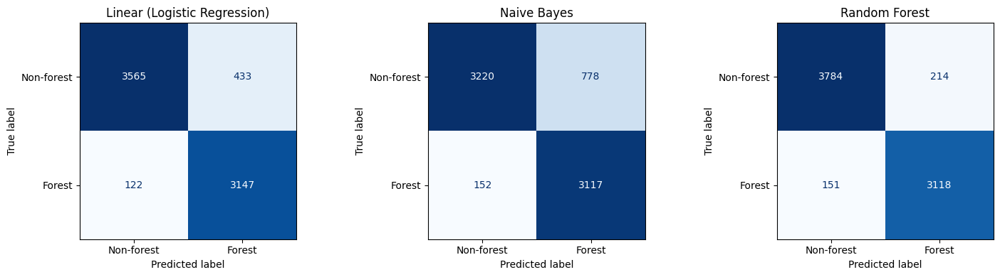

In [14]:
# Evaluate all classifiers
classifiers = {
    "Linear (Logistic Regression)": linear_pred_test,
    "Naive Bayes": nb_pred_test,
    "Random Forest": rf_pred_test,
}

print("=" * 60)
for name, pred in classifiers.items():
    acc = accuracy_score(y_test, pred)
    print(f"\n{name}")
    print("-" * 40)
    print(f"Accuracy: {acc:.4f}")
    print(classification_report(y_test, pred, target_names=["Non-forest", "Forest"]))

# Plot confusion matrices
fig6, axes6 = plt.subplots(1, 3, figsize=(15, 4))
for _ax, (name, pred) in zip(axes6, classifiers.items()):
    ConfusionMatrixDisplay.from_predictions(
        y_test,
        pred,
        display_labels=["Non-forest", "Forest"],
        cmap="Blues",
        ax=_ax,
        colorbar=False,
    )
    _ax.set_title(name)
plt.tight_layout()

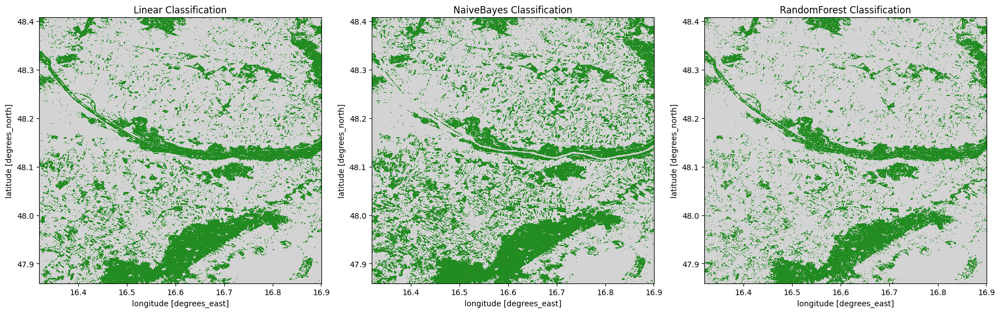

In [15]:
# Add predictions to dataset for visualization
ds_results = ds_class.copy()

ds_results["Linear"] = xr.DataArray(
    linear_pred_img,
    dims=["latitude", "longitude"],
    coords={"longitude": ds_class["longitude"], "latitude": ds_class["latitude"]},
)
ds_results["NaiveBayes"] = xr.DataArray(
    nb_pred_img,
    dims=["latitude", "longitude"],
    coords={"longitude": ds_class["longitude"], "latitude": ds_class["latitude"]},
)
ds_results["RandomForest"] = xr.DataArray(
    rf_pred_img,
    dims=["latitude", "longitude"],
    coords={"longitude": ds_class["longitude"], "latitude": ds_class["latitude"]},
)

# Plot all three classifier maps
cmap_forest = mcolors.ListedColormap(["lightgray", "forestgreen"])

fig7, axes7 = plt.subplots(1, 3, figsize=(18, 6))
for _ax, _var in zip(axes7, ["Linear", "NaiveBayes", "RandomForest"]):
    ds_results[_var].plot.imshow(ax=_ax, cmap=cmap_forest, add_colorbar=False)
    _ax.set_title(f"{_var} Classification")
    _ax.set_aspect("equal")
plt.tight_layout()

Based on our classification reports, random forest model performs best (95% accuracy), followed by linear classification/logistic regression (92%), and then Naive Bayes (87%). Note that the naive Bayes classifier struggles particularly with over-predicting forest. Also, the linear classifier--a much simpler model than the random forest--performs quite respectably! 

---
## Part 4: Model Comparison — 2×2 Grids and Disagreement Maps

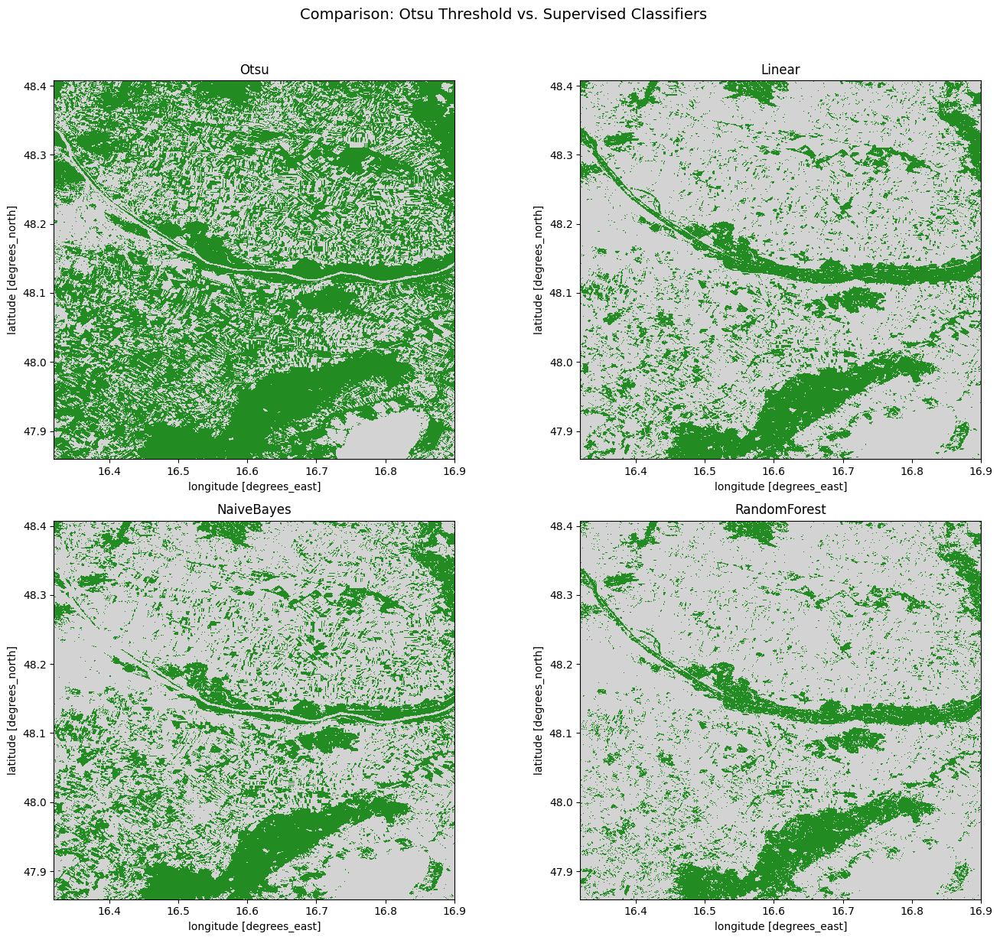

In [16]:
# Add Otsu result to dataset
ds_results["Otsu"] = xr.DataArray(
    vegetation_mask_otsu.values.astype(float),
    dims=["latitude", "longitude"],
    coords={"longitude": ds_results["longitude"], "latitude": ds_results["latitude"]},
)

# 2x2 grid of all methods
fig8, axes8 = plt.subplots(2, 2, figsize=(14, 12))
axes8 = axes8.ravel()

methods = ["Otsu", "Linear", "NaiveBayes", "RandomForest"]
for _ax, _method in zip(axes8, methods):
    ds_results[_method].plot.imshow(ax=_ax, cmap=cmap_forest, add_colorbar=False)
    _ax.set_title(f"{_method}")
    _ax.set_aspect("equal")

plt.suptitle(
    "Comparison: Otsu Threshold vs. Supervised Classifiers", fontsize=14, y=1.02
)
plt.tight_layout()

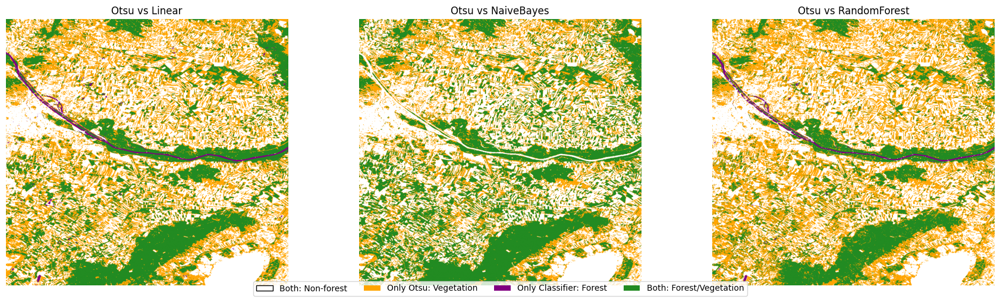

In [ ]:
# Create disagreement maps: Otsu vs each classifier
fig9, axes9 = plt.subplots(1, 3, figsize=(18, 5))

# Colormap: 0=both agree non-forest, 1=only Otsu, 2=only classifier, 3=both agree forest
cmap_disagree = mcolors.ListedColormap(["white", "orange", "purple", "forestgreen"])

otsu_arr = ds_results["Otsu"].values

for _ax, _method in zip(axes9, ["Linear", "NaiveBayes", "RandomForest"]):
    _clf_arr = ds_results[_method].values
    # Combine: otsu + 2*classifier gives 0, 1, 2, or 3
    _disagreement = otsu_arr.astype(int) + 2 * _clf_arr.astype(int)

    _im = _ax.imshow(_disagreement, cmap=cmap_disagree, vmin=0, vmax=3)
    _ax.set_title(f"Otsu vs {_method}")
    _ax.set_aspect("equal")
    _ax.axis("off")

# Add legend
legend_elements = [
    Patch(facecolor="white", edgecolor="black", label="Both: Non-forest"),
    Patch(facecolor="orange", label="Only Otsu: Vegetation"),
    Patch(facecolor="purple", label="Only Classifier: Forest"),
    Patch(facecolor="forestgreen", label="Both: Forest/Vegetation"),
]
fig9.legend(
    handles=legend_elements, loc="lower center", ncol=4, bbox_to_anchor=(0.5, -0.02)
)
plt.tight_layout()

Notice that our Otsu threshold identifies a lot of agricultural land as vegetation---obviously this isn't sufficient to identify non-_forest_. However, neither Otsu nor naive Bayes classify the Danube river as forest, while both our linear classifier and random forest make this mistake!

One possibility here is a kind of post-processing using logical rules like we saw in the Mapbiomas example in class. For example, we might take the random forest outputs and then elimiate anywhere pixels identified as forest that have an NDVI value below Otsu's threshold, or eliminate isolated pixels.

---
## Part 5: Feature Engineering — Adding NDVI

Let's add NDVI as an additional feature to our best-performing model and see if it improves classification.

In [18]:
# Add NDVI to the dataset
ds_class_ndvi = ds_class.copy()
ds_class_ndvi["ndvi"] = ndvi_median.compute().fillna(
    0
)  # Materialize NDVI before clipping
bands_with_ndvi = bands + ["ndvi"]

# Extract features with NDVI
feat_data_ndvi = [
    clip_array(ds_class_ndvi, polygon)
    .to_array()
    .values.reshape(len(bands_with_ndvi), -1)
    .T
    for polygon in forest_areas.values()
]
nonfeat_data_ndvi = [
    clip_array(ds_class_ndvi, polygon)
    .to_array()
    .values.reshape(len(bands_with_ndvi), -1)
    .T
    for polygon in nonforest_areas.values()
]

feat_values_ndvi = np.concatenate(feat_data_ndvi)
nonfeat_values_ndvi = np.concatenate(nonfeat_data_ndvi)
X_feat_ndvi = feat_values_ndvi[~np.isnan(feat_values_ndvi).any(axis=1)]
X_nonfeat_ndvi = nonfeat_values_ndvi[~np.isnan(nonfeat_values_ndvi).any(axis=1)]

# Combine and split
y_feat_ndvi = np.ones(X_feat_ndvi.shape[0])
y_nonfeat_ndvi = np.zeros(X_nonfeat_ndvi.shape[0])
X_ndvi = np.concatenate([X_feat_ndvi, X_nonfeat_ndvi])
y_ndvi = np.concatenate([y_feat_ndvi, y_nonfeat_ndvi])
X_train_ndvi, X_test_ndvi, y_train_ndvi, y_test_ndvi = train_test_split(
    X_ndvi, y_ndvi, test_size=0.3, random_state=42, stratify=y_ndvi
)

# Train Random Forest with NDVI feature
rf_clf_ndvi = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf_ndvi.fit(X_train_ndvi, y_train_ndvi)
rf_pred_ndvi = rf_clf_ndvi.predict(X_test_ndvi)

# Predict on full image
image_data_ndvi = (
    ds_class_ndvi[bands_with_ndvi]
    .to_array(dim="band")
    .transpose("latitude", "longitude", "band")
)
X_image_ndvi = image_data_ndvi.values.reshape(-1, len(bands_with_ndvi))
rf_pred_img_ndvi = rf_clf_ndvi.predict(X_image_ndvi).reshape(img_shape)

# Evaluate
acc_ndvi = accuracy_score(y_test_ndvi, rf_pred_ndvi)
print("Random Forest WITH NDVI Feature")
print("=" * 40)
print(f"Accuracy: {acc_ndvi:.4f}")
print(
    classification_report(
        y_test_ndvi, rf_pred_ndvi, target_names=["Non-forest", "Forest"]
    )
)

Random Forest WITH NDVI Feature
Accuracy: 0.9499
              precision    recall  f1-score   support

  Non-forest       0.96      0.95      0.95      3998
      Forest       0.93      0.96      0.94      3269

    accuracy                           0.95      7267
   macro avg       0.95      0.95      0.95      7267
weighted avg       0.95      0.95      0.95      7267



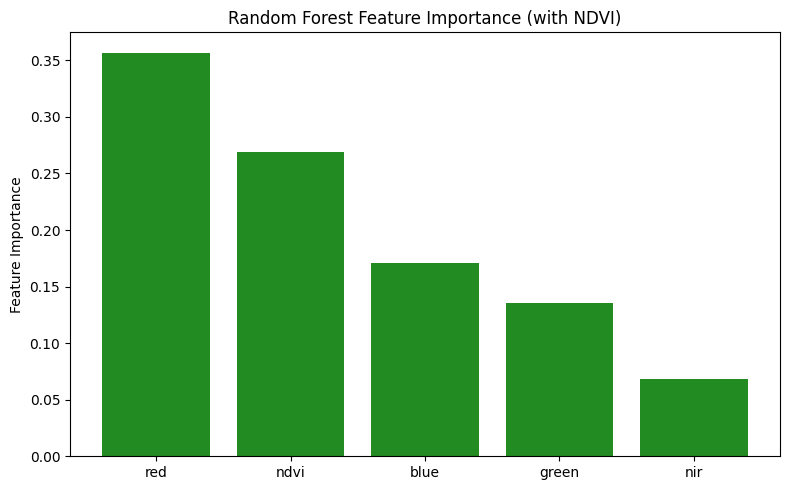

In [19]:
# Feature importance
importances = rf_clf_ndvi.feature_importances_
indices = np.argsort(importances)[::-1]

fig10, ax10 = plt.subplots(figsize=(8, 5))
ax10.bar(range(len(bands_with_ndvi)), importances[indices], color="forestgreen")
ax10.set_xticks(range(len(bands_with_ndvi)))
ax10.set_xticklabels([bands_with_ndvi[i] for i in indices])
ax10.set_ylabel("Feature Importance")
ax10.set_title("Random Forest Feature Importance (with NDVI)")
plt.tight_layout()

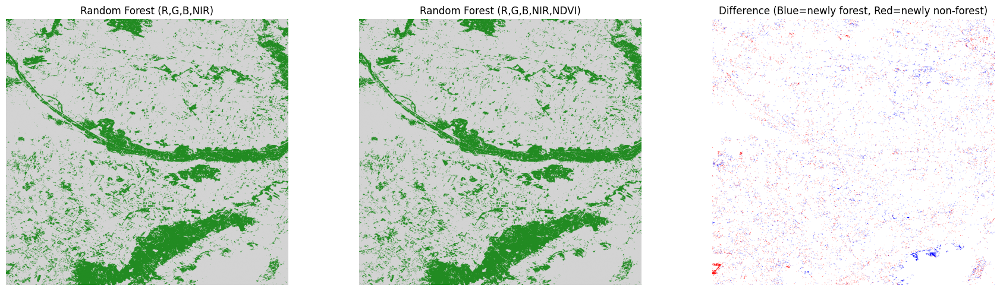

In [20]:
# Compare RF with and without NDVI
fig11, axes11 = plt.subplots(1, 3, figsize=(18, 5))

# Original RF
axes11[0].imshow(rf_pred_img, cmap=cmap_forest)
axes11[0].set_title("Random Forest (R,G,B,NIR)")
axes11[0].axis("off")

# RF with NDVI
axes11[1].imshow(rf_pred_img_ndvi, cmap=cmap_forest)
axes11[1].set_title("Random Forest (R,G,B,NIR,NDVI)")
axes11[1].axis("off")

# Difference
diff = rf_pred_img_ndvi.astype(int) - rf_pred_img.astype(int)
cmap_diff = mcolors.ListedColormap(["red", "white", "blue"])
axes11[2].imshow(diff, cmap=cmap_diff, vmin=-1, vmax=1)
axes11[2].set_title("Difference (Blue=newly forest, Red=newly non-forest)")
axes11[2].axis("off")

plt.tight_layout()

Notice that including NDVI doesn't really improve our model performance. Random forest models are great at learning implicit, non-linear relationships, and since NDVI is just a ratio for NIR and RED, our RF model was able to learn this relationship without us needing to do feature engineering. Pretty cool! 

This is a great example of why feature importance matters. If your model is already leveraging the bands that compose an index, engineering that index won't help. Feature engineering adds value when it encodes domain knowledge the model can't easily learn from raw inputs, like temporal signatures or multi-sensor integration. On the other hand, it _would_ help in the case of the linear classifier, which struggles to learn non-linear relationships.